# 1. SETUP AND ENVIRONMENT


## 1.1. Install Libraries

In [ ]:
# Note: Comment the following lines if the packages are already installed.
!pip install -q scanpy squidpy anndata
!pip install -q python-igraph leidenalg
!pip install -q scikit-learn scikit-misc

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 1.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.3/161.3 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.1/169.1 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.2/58.2 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 51.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.6/51.6 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.6/183.6 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.7/44.7 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.3/211.3 kB 14.6 MB/s eta 0:00:00
   ━━━━

## 1.2. Import Necessary Packages


In [ ]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import warnings
warnings.filterwarnings('ignore')

/usr/lib/python3.11/importlib/__init__.py:126: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name[level:], package, level)
/usr/local/lib/python3.11/dist-packages/cudf/utils/gpu_utils.py:75: UserWarning: Failed to dlopen libcuda.so.1
  warnings.warn(str(e))
/usr/local/lib/python3.11/dist-packages/anndata/__init__.py:44: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)


## 1.3. Set Seeds and Parameters for Reproducibility


In [ ]:
sc.set_figure_params(figsize=(8, 8), facecolor="white")
sc.settings.seed = 42
np.random.seed(42)

# 2. DATA LOADING AND PREPROCESSING

## 2.1. Load Data

In [ ]:
# ---
# **Action Required:**
# Place your data files in a directory and update `DATA_DIR` to point to it.
# The expected files are, for example:
# - `V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5`
# - `tissue_positions_list.csv`
# ---
DATA_DIR = "/content/drive/MyDrive/ERP/Breast_Cancer" # IMPORTANT: Update this path to your data directory

try:
    h5_path = f"{DATA_DIR}/V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5"
    positions_path = f"{DATA_DIR}/tissue_positions_list.csv"
    adata = sc.read_10x_h5(filename=h5_path)
    positions_df = pd.read_csv(positions_path, header=None, index_col=0)
except FileNotFoundError:
    print("="*80)
    print("ERROR: Data files not found.")
    print(f"Please make sure your .h5 and .csv files are in the directory: '{DATA_DIR}'")
    print("Update the `DATA_DIR` variable in the script if they are elsewhere.")
    print("="*80)
    # Create dummy adata to avoid crashing the rest of the script for demonstration
    adata = sc.AnnData(np.random.rand(100, 100))
    adata.obs_names = [f'cell_{i}' for i in range(100)]
    adata.var_names = [f'gene_{i}' for i in range(100)]
    positions_df = pd.DataFrame(np.random.randint(0,100, (100,5)), index=adata.obs_names)


adata.var_names_make_unique()

# Load and align spatial coordinates
positions_df.columns = [
    'in_tissue', 'array_row', 'array_col',
    'pxl_col_in_fullres', 'pxl_row_in_fullres'
]
common_barcodes = adata.obs_names.intersection(positions_df.index)
adata = adata[common_barcodes, :].copy()
positions_df = positions_df.loc[common_barcodes, :]
adata.obsm['spatial'] = positions_df[['pxl_col_in_fullres', 'pxl_row_in_fullres']].to_numpy()
adata.obs = adata.obs.join(positions_df)

print("--- Assembled AnnData Object ---")
print(adata)

--- Assembled AnnData Object ---
AnnData object with n_obs × n_vars = 3798 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'


## 2.2. Visualize Initial Spot Layout

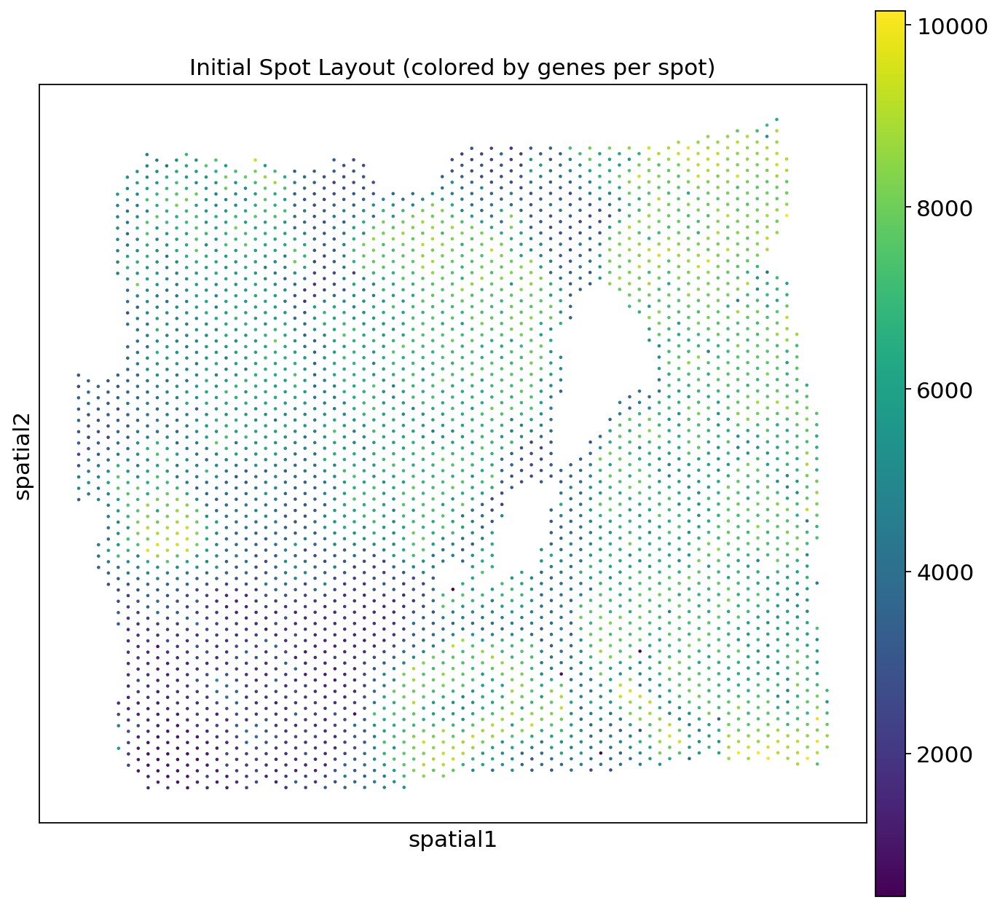

In [ ]:
# Calculate QC metrics including n_genes_by_counts
sc.pp.calculate_qc_metrics(adata, inplace=True)

sc.set_figure_params(figsize=(10, 10), facecolor="white")

# Visualize the spatial layout of the spots
# We set img_key=None because we don't have an image file.
# library_id is only needed if we are referencing data like scale factors or image path
# stored in adata.uns['spatial'][library_id]. Since we don't have an image,
# and are not using a library_id to load image data, we can remove it.
sc.pl.spatial(adata, img_key=None,
              color="n_genes_by_counts", spot_size=80, cmap='viridis',
              title="Initial Spot Layout (colored by genes per spot)")

## 2.3. Calculate and Visualize QC Metrics

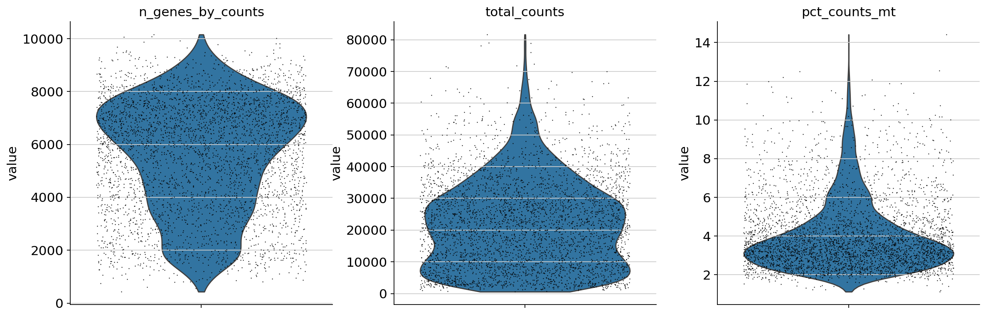

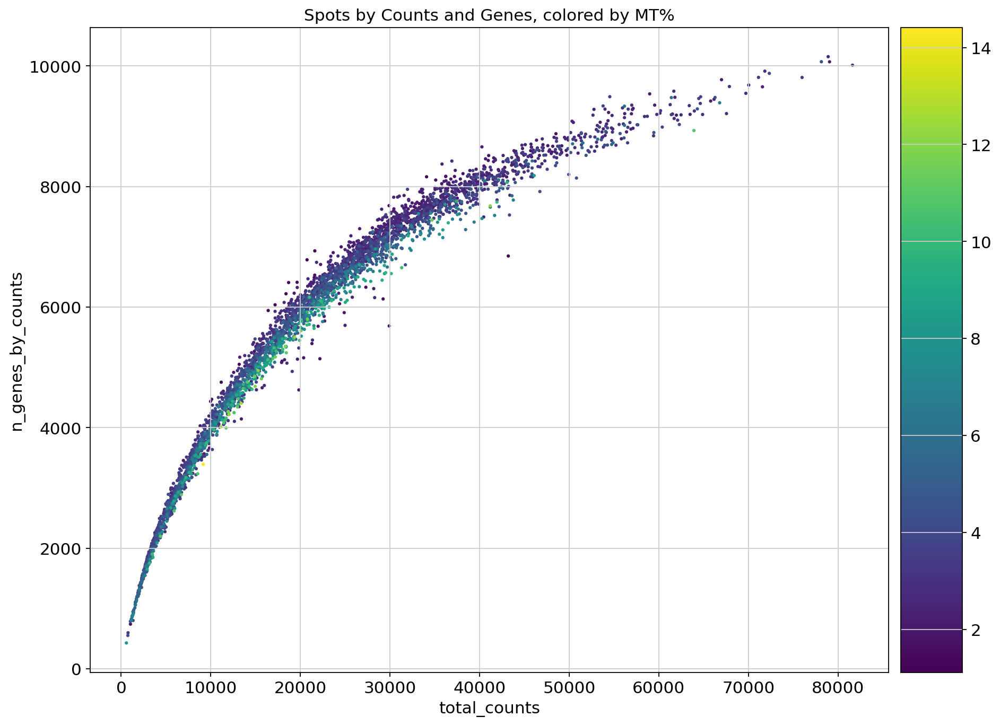

In [ ]:
# Identify mitochondrial genes
adata.var['mt'] = adata.var_names.str.startswith('MT-')

# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

# Visualize QC metrics before filtering to inform our thresholds
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, show=True)

sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt',
              title="Spots by Counts and Genes, colored by MT%", show=True)

## 2.4. Preprocessing Pipeline


In [ ]:
print("\n--- Starting Preprocessing ---")
print(f"Initial state: {adata.n_obs} spots, {adata.n_vars} genes")

# 1. Quality Control and Filtering
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)
sc.pp.filter_cells(adata, min_genes=200)
adata = adata[adata.obs['pct_counts_mt'] < 10, :]
adata = adata[adata.obs['total_counts'] < 60000, :]
sc.pp.filter_genes(adata, min_cells=10)
print(f"After filtering: {adata.n_obs} spots, {adata.n_vars} genes")

# 2. Normalization and Transformation
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)

# 3. Highly Variable Gene (HVG) Selection
sc.pp.highly_variable_genes(adata, n_top_genes=4000, flavor='seurat_v3')
adata.raw = adata
adata = adata[:, adata.var.highly_variable]
print(f"After HVG selection: {adata.n_obs} spots, {adata.n_vars} genes")

# 4. Scaling
sc.pp.scale(adata, max_value=10)

# 5. Dimensionality Reduction, Clustering, and Graph Construction
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
sc.tl.leiden(adata, key_added="clusters", resolution=0.6) # Adjusted resolution for potentially better clusters
sc.tl.umap(adata)
sq.gr.spatial_neighbors(adata, coord_type="grid", n_rings=1)

print("\n--- Preprocessing Complete ---")
print(adata)
print(f"\nIdentified clusters: {adata.obs['clusters'].nunique()}")


--- Starting Preprocessing ---
Initial state: 3798 spots, 36601 genes
After filtering: 3715 spots, 19618 genes
After HVG selection: 3715 spots, 4000 genes

--- Preprocessing Complete ---
AnnData object with n_obs × n_vars = 3715 × 4000
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'n_genes', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'clusters', 'umap', 'spatial_neighbors'
    obsm: 's

# 3. Final UMAP and Spatial Plots

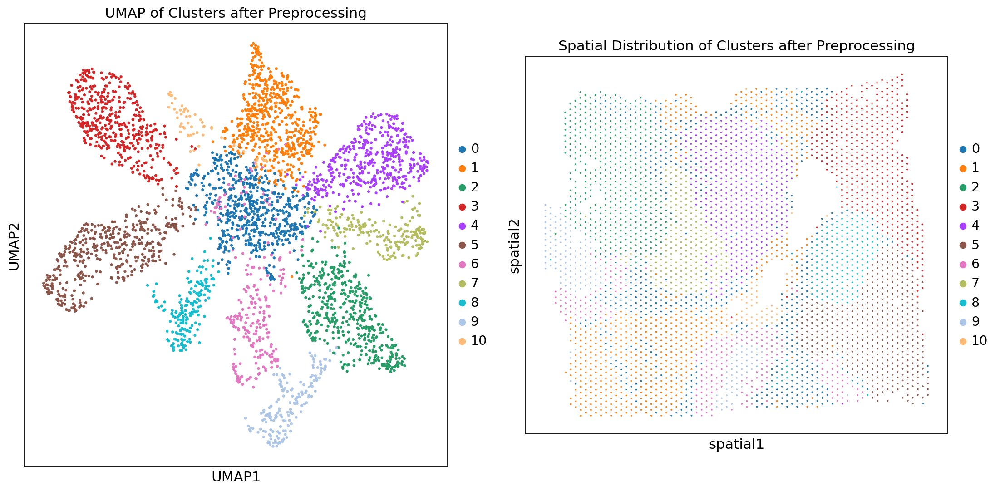

In [ ]:
# Visualize UMAP and Spatial Distribution side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Visualize UMAP
sc.pl.umap(adata, color='clusters', title='UMAP of Clusters after Preprocessing', ax=axes[0], show=False)

# Visualize Spatial Distribution
sc.pl.spatial(adata, color='clusters', spot_size=80, title='Spatial Distribution of Clusters after Preprocessing', ax=axes[1], show=False)

plt.tight_layout()
plt.show()

# 4. Build and Visualize the Spatial Graph

Spatial graph constructed successfully.
Number of edges in the graph: 10629


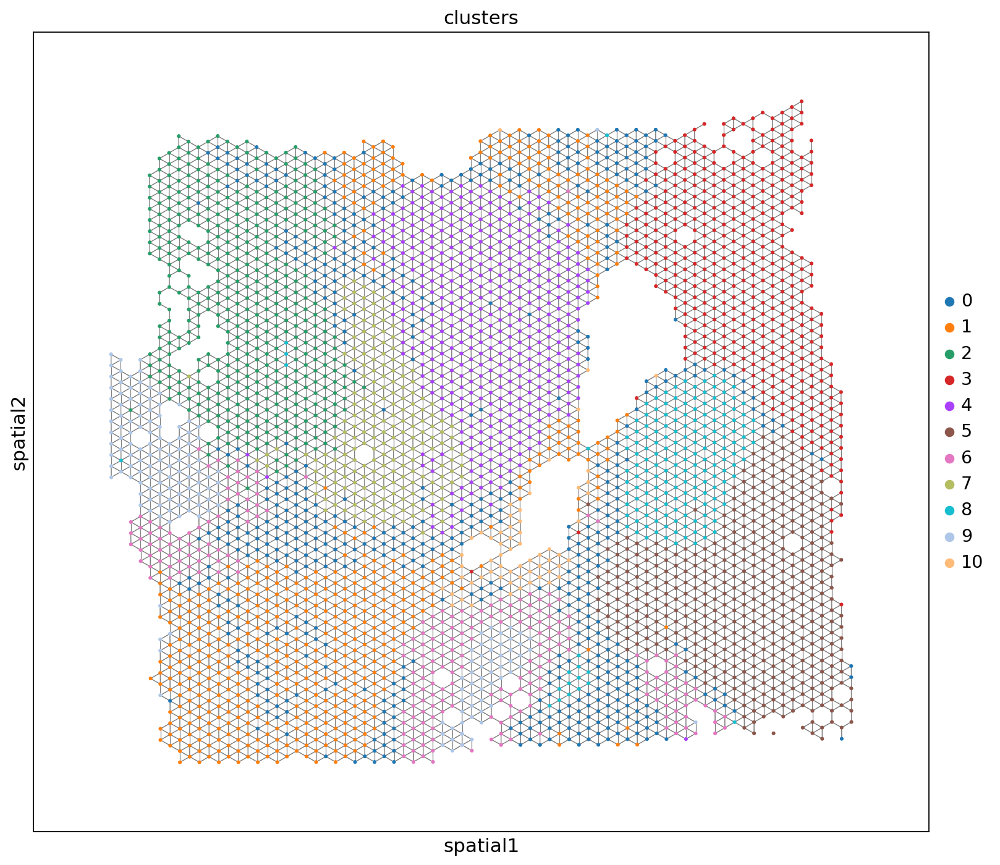

In [ ]:
# Build and Visualize the Spatial Graph
sq.gr.spatial_neighbors(adata, coord_type="grid", n_rings=1)

print("Spatial graph constructed successfully.")
print(f"Number of edges in the graph: {int(adata.obsp['spatial_connectivities'].sum() / 2)}")


# Visualize the graph using squidpy's dedicated scatter plot function.
sq.pl.spatial_scatter(
    adata,
    shape=None,
    color="clusters",          # Color the spots by the cluster labels we found
    connectivity_key="spatial_connectivities", # The key where the graph is stored
    edges_width=0.5,           # Adjust edge thickness
    size=10                    # Adjust size of the spots
)

# 5. Biological Interpretation

## 5.1. Find Marker Genes for Each Cluster

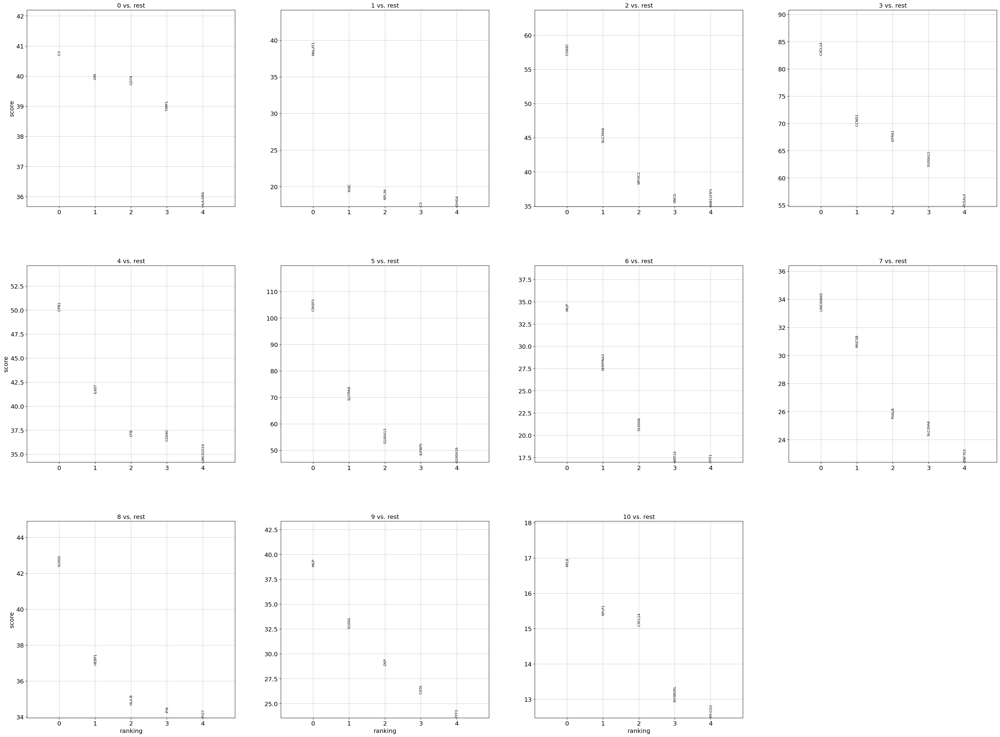


--- Top 10 Marker Genes for Cluster 0 ---
0          C3
1         VIM
2        CD74
3       TIMP1
4     HLA-DRA
5    HLA-DPB1
6      COL6A2
7        C1QA
8      TMSB4X
9    HLA-DPA1
Name: 0, dtype: object


In [ ]:
# Use the rank_genes_groups function to perform differential expression.
# This will find genes that are upregulated in each cluster.
# 't-test' is a common method for this.
sc.tl.rank_genes_groups(adata, 'clusters', method='t-test')

# The results are stored in adata.uns['rank_genes_groups']

# We can visualize the top markers for each cluster in a simple dot plot.
# The plot shows the expression level and the fraction of cells expressing
# the gene in each cluster.
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False, show=True)

# We can also view the top genes for a specific cluster as a table
marker_df = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
print("\n--- Top 10 Marker Genes for Cluster 0 ---")
print(marker_df[('0')].head(10))

## 5.2. Visualize Known Markers on Spatial Plots

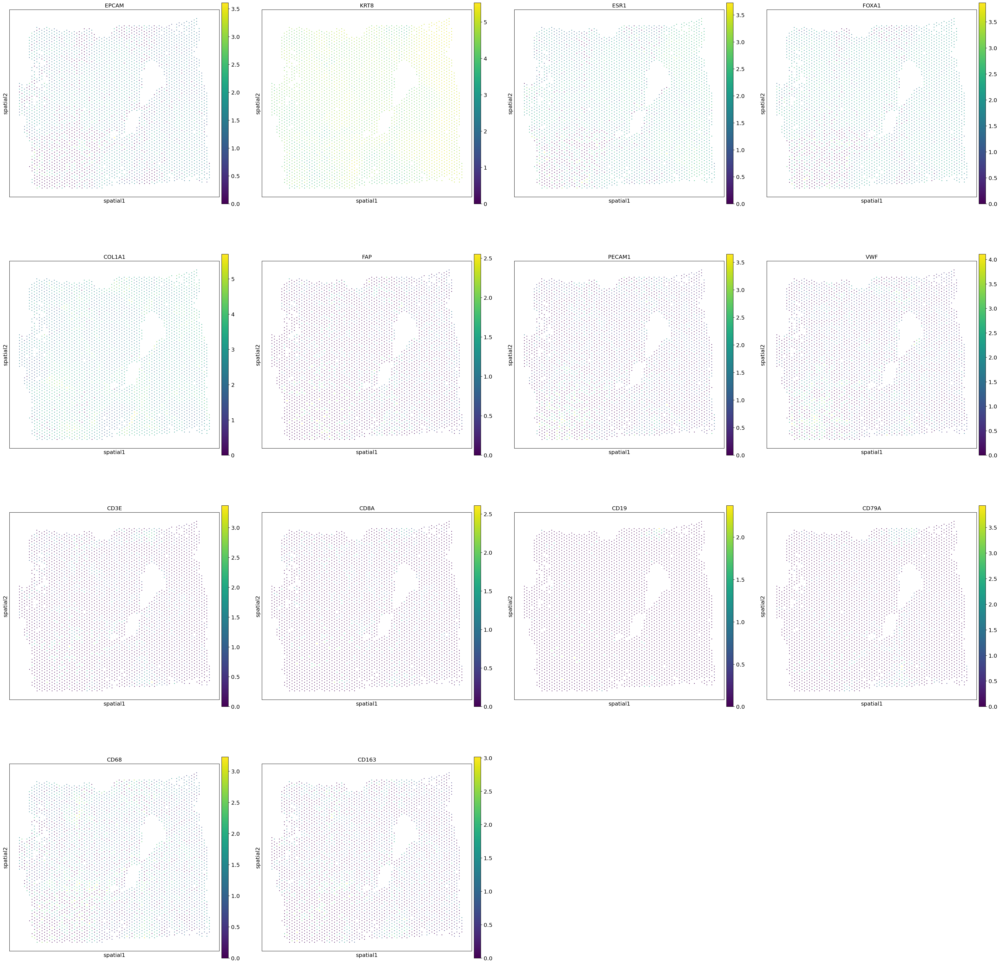

In [ ]:
# Define a list of known marker genes to check
marker_genes = [
    'EPCAM', 'KRT8', # Cancer Epithelial
    'ESR1', 'FOXA1', # Luminal Cancer
    'COL1A1', 'FAP', # Fibroblasts (Stroma)
    'PECAM1', 'VWF', # Endothelial (Vessels)
    'CD3E', 'CD8A',  # T-cells
    'CD19', 'CD79A', # B-cells
    'CD68', 'CD163'  # Macrophages
]

# Create spatial plots for each marker gene.
# We will use the log-normalized data from adata.raw for visualization.
# This ensures we are looking at the gene's expression even if it wasn't an HVG.
sc.pl.spatial(adata, color=marker_genes, spot_size=70, ncols=4,
              use_raw=True, vmin=0)

# 6. Final AnnData Object

In [ ]:
print("--- Final Preprocessed AnnData Object ---")
print(adata)
print("\nKey data stored:")
print(f"Normalized & HVG-filtered expression matrix in adata.X (shape: {adata.X.shape})")
print(f"Full log-normalized expression matrix in adata.raw.X (shape: {adata.raw.X.shape})")
print(f"Spatial coordinates in adata.obsm['spatial']")
print(f"Spatial graph in adata.obsp['spatial_connectivities']")
print(f"Cluster labels in adata.obs['clusters']")

--- Final Preprocessed AnnData Object ---
AnnData object with n_obs × n_vars = 3715 × 4000
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_col_in_fullres', 'pxl_row_in_fullres', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'n_genes', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'clusters', 'umap', 'spatial_neighbors', 'clusters_colors', 'rank_genes_groups'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities', 'spatial_connectivitie